<a href="https://colab.research.google.com/github/douglasmmachado/MedicineConsumption/blob/master/notebooks/Old/Timeseries_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Exploring the timeseries approach for the unified database

---



---



# Loading libs and database

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns
import math as m

raw_data_url ="https://raw.githubusercontent.com/douglasmmachado/ExploratoryDataAnalysis/master/datasets/project_database.csv"
df=pd.read_csv(raw_data_url, index_col=0)

categorical_features = ['ID_REF', 'ID_SITE_RATTACHE', 'CODE_ATC', 'HOSPI_CODE_UCD']
date_features = ['DATE_MOUV', 'WEEK', 'MONTH', 'YEAR']
numerical_features = ['N_UFS', 'QUANTITY', 'N_ETB', 'POPULATION', 'P_MEDICAL', 'PN_MEDICAL', 'LIT_HC', 'LIT_HP', 'SEJ_MCO', 'SEJ_HAD', 'SEJ_PSY', 'SEJ_SSR']

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 75692 entries, 0 to 75691
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ID_REF            75689 non-null  object 
 1   ID_SITE_RATTACHE  75690 non-null  object 
 2   CODE_ATC          75685 non-null  object 
 3   HOSPI_CODE_UCD    75690 non-null  object 
 4   DATE_MOUV         75685 non-null  object 
 5   N_UFS             75692 non-null  int64  
 6   QUANTITY          75685 non-null  float64
 7   WEEK              75685 non-null  float64
 8   MONTH             75692 non-null  int64  
 9   YEAR              75685 non-null  float64
 10  N_ETB             75692 non-null  int64  
 11  POPULATION        75692 non-null  float64
 12  P_MEDICAL         75692 non-null  int64  
 13  PN_MEDICAL        75692 non-null  int64  
 14  LIT_HC            75685 non-null  float64
 15  LIT_HP            75692 non-null  float64
 16  SEJ_MCO           75692 non-null  int64 

<ipython-input-189-0579240c786e>:9: DtypeWarning: Columns (1,4) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv(raw_data_url, index_col=0)


# Data cleaning

In [ ]:
df = df.drop_duplicates()
df = df.dropna()
df['DATE_MOUV'] = pd.to_datetime(df['DATE_MOUV'],
               format='%Y-%m-%d')  # Changed the type of date too

for column in categorical_features:
  df[column] = df[column].astype('string')

# Changing the date display by year-month division
df['YEAR'] = df['YEAR'].astype(int)
df['MONTH'] = df['MONTH'].astype(int)

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 75684 entries, 0 to 75691
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   ID_REF            75684 non-null  string        
 1   ID_SITE_RATTACHE  75684 non-null  string        
 2   CODE_ATC          75684 non-null  string        
 3   HOSPI_CODE_UCD    75684 non-null  string        
 4   DATE_MOUV         75684 non-null  datetime64[ns]
 5   N_UFS             75684 non-null  int64         
 6   QUANTITY          75684 non-null  float64       
 7   WEEK              75684 non-null  float64       
 8   MONTH             75684 non-null  int64         
 9   YEAR              75684 non-null  int64         
 10  N_ETB             75684 non-null  int64         
 11  POPULATION        75684 non-null  float64       
 12  P_MEDICAL         75684 non-null  int64         
 13  PN_MEDICAL        75684 non-null  int64         
 14  LIT_HC            7568

## Removing outliers by hospital and by drug

In [ ]:
def remove_outliers(df, columns, verbose=False):
    N_macro = df.shape[0]
    new_df = pd.DataFrame()  # Create an empty DataFrame to store the filtered values
    removed_outliers = 0  # Variable to keep track of the total number of removed outliers

    for col in columns:
        for ucd_code in df['HOSPI_CODE_UCD'].unique():
            # Filter the dataframe for the specific HOSPI_CODE_UCD
            df_subset = df[df['HOSPI_CODE_UCD'] == ucd_code]
            N = df_subset.shape[0]

            # Calculate the statistics for the column within the HOSPI_CODE_UCD subset
            q25, q75 = np.percentile(df_subset[col], [25, 75])
            iqr = q75 - q25
            lower, upper = q25 - (iqr * 1.5), q75 + (iqr * 1.5)

            # Remove outliers based on the cutoff values within the HOSPI_CODE_UCD subset
            df_filtered = df_subset[(df_subset[col] >= lower) & (df_subset[col] <= upper)]
            N_new = df_filtered.shape[0]
            delta = N - N_new

            # Update the new DataFrame with the filtered values
            new_df = pd.concat([new_df, df_filtered])

            if verbose:
                if delta > 0:
                    print(f'Column: {col}')
                    print(f'HOSPI_CODE_UCD: {ucd_code}')
                    print(f'Removed outliers: {delta}')
                    print(f'Removed percentage: {(100 * delta / N):.3}%')
                    print()

            removed_outliers += delta

    new_df.reset_index(drop=True, inplace=True)
    print('N_old:', N_macro)
    N_macro_new = new_df.shape[0]
    print('N_new:', N_macro_new)
    delta = N_macro - N_macro_new
    print(f'Total removed outliers: {(100 * delta / N_macro):.3}%')

    return new_df


In [ ]:
def visualize_distribution(df, features):
  '''
    Plot of distribution for the numerical features after removing the outliers
  '''

  fig, axes = plt.subplots(4, 3,sharex=False, figsize=(20,20))

  i = 0
  j = 0
  for column in features:
    sns.histplot(df[column], kde=True, stat="density", kde_kws=dict(cut=3),alpha=.4, edgecolor=(1, 1, 1, .4),ax=axes[i, j]).set(title='Distribution of: ' + str(column))
    if j == 2:
      i += 1
      j = 0
    else:
      j+=1

In [ ]:
# Separating databases

n_medicines = df['HOSPI_CODE_UCD'].nunique()
print('Number of different medicines: ', n_medicines)

df_h1 = df[df["ID_SITE_RATTACHE"] == "HOSPI_1"]
df_h2 = df[df["ID_SITE_RATTACHE"] == "HOSPI_2"]
df_h3 = df[df["ID_SITE_RATTACHE"] == "HOSPI_3"]
df_h4 = df[df["ID_SITE_RATTACHE"] == "HOSPI_4"]


Number of different medicines:  21


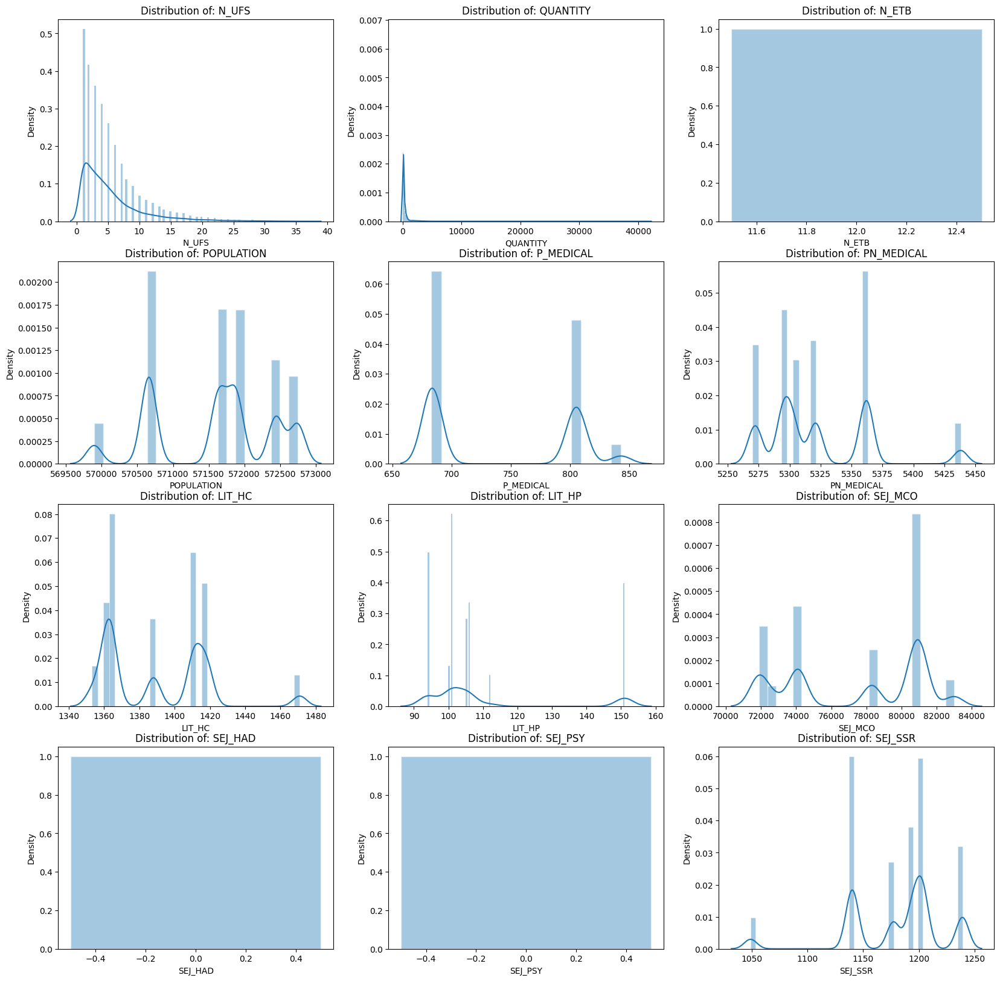

In [ ]:
# Visualizing distribution before outlier removing
# Hospital 1
visualize_distribution(df_h1, numerical_features)

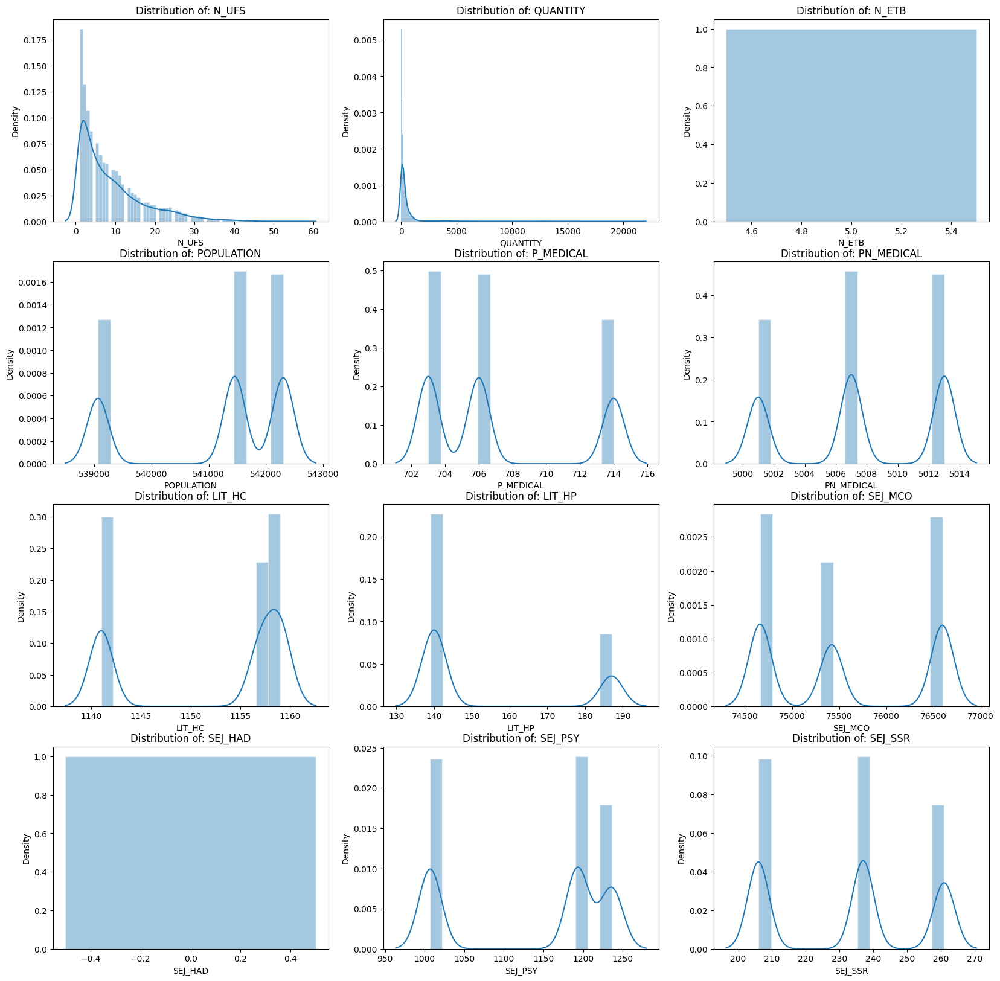

In [ ]:
# Visualizing distribution before outlier removing
# Hospital 2
visualize_distribution(df_h2, numerical_features)

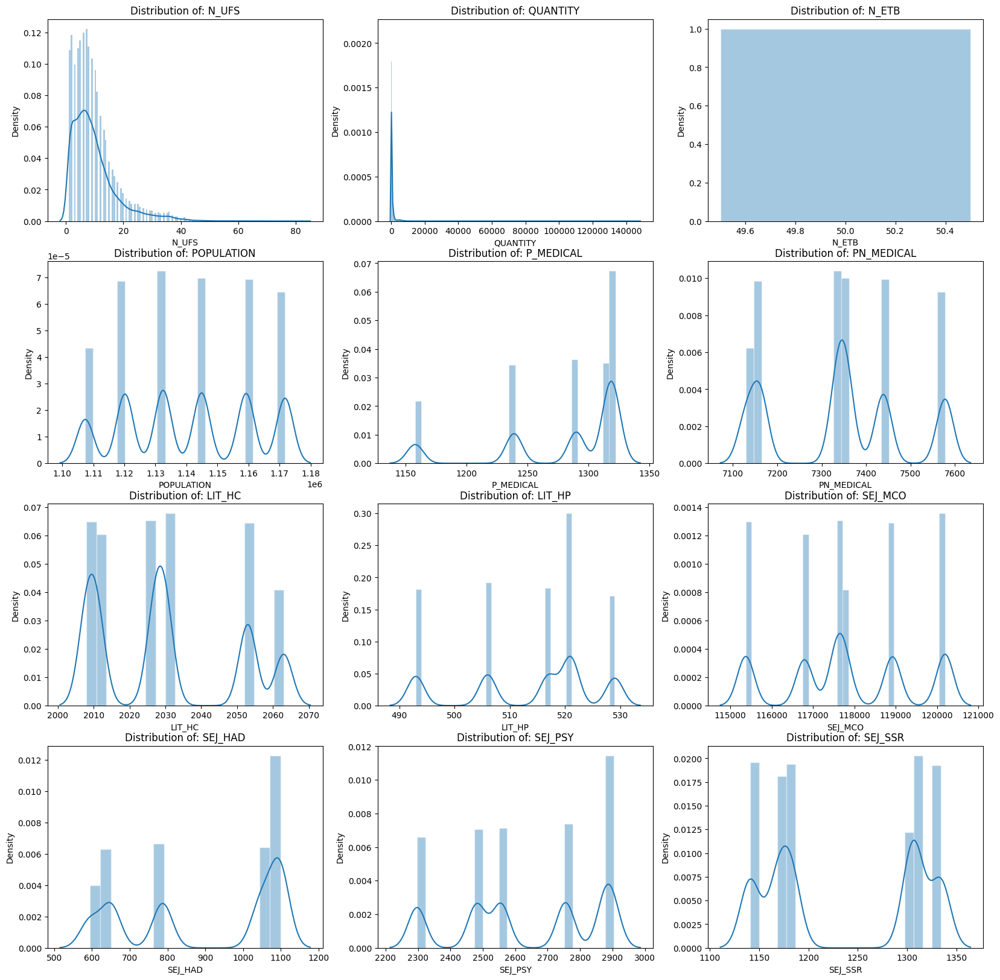

In [ ]:
# Visualizing distribution before outlier removing
# Hospital 3
visualize_distribution(df_h3, numerical_features)

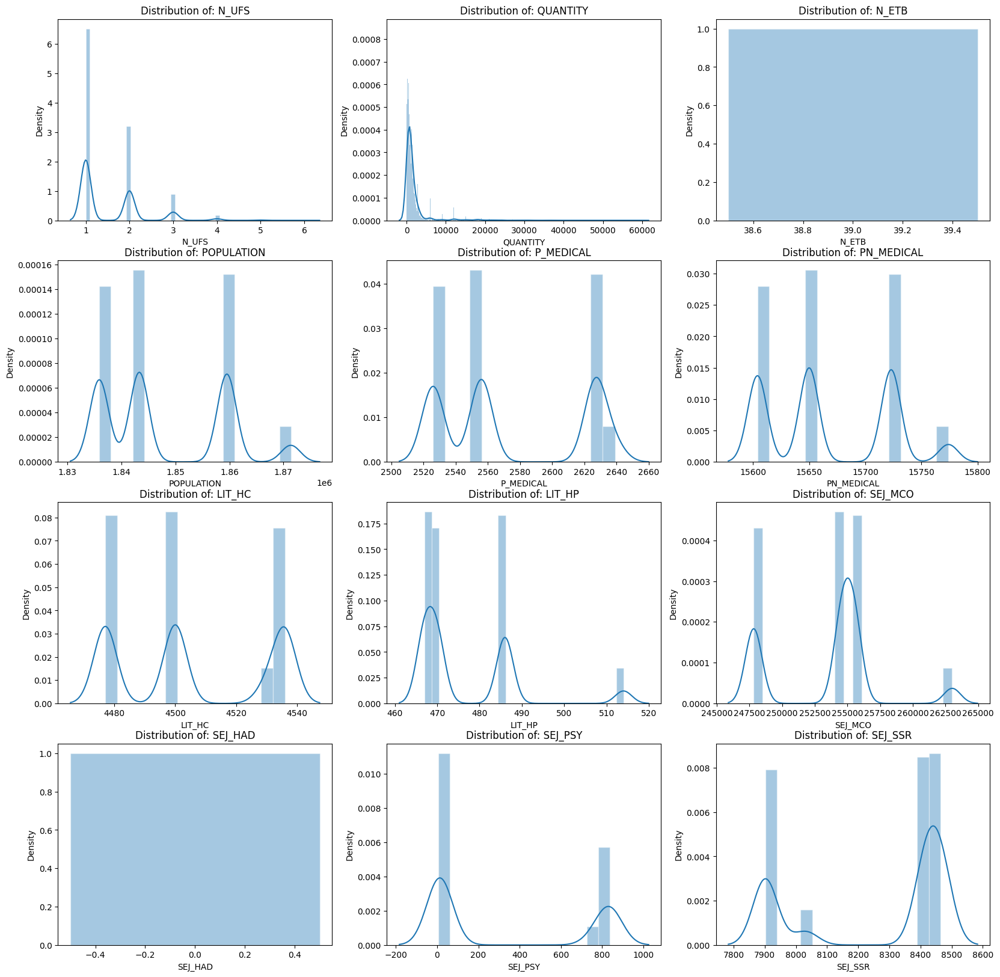

In [ ]:
# Visualizing distribution before outlier removing
# Hospital 4
visualize_distribution(df_h4, numerical_features)

In [ ]:
print("-"*100)
df_h1 = remove_outliers(df_h1, ["QUANTITY"], verbose = False)

print("-"*100)
df_h2 = remove_outliers(df_h2, ["QUANTITY"], verbose = False)

print("-"*100)
df_h3 = remove_outliers(df_h3, ["QUANTITY"], verbose = False)

print("-"*100)
df_h4 = remove_outliers(df_h4, ["QUANTITY"], verbose = False)

----------------------------------------------------------------------------------------------------
N_old: 22725
N_new: 21715
Total removed outliers: 4.44%
----------------------------------------------------------------------------------------------------
N_old: 15439
N_new: 14953
Total removed outliers: 3.15%
----------------------------------------------------------------------------------------------------
N_old: 27591
N_new: 26801
Total removed outliers: 2.86%
----------------------------------------------------------------------------------------------------
N_old: 9929
N_new: 9638
Total removed outliers: 2.93%


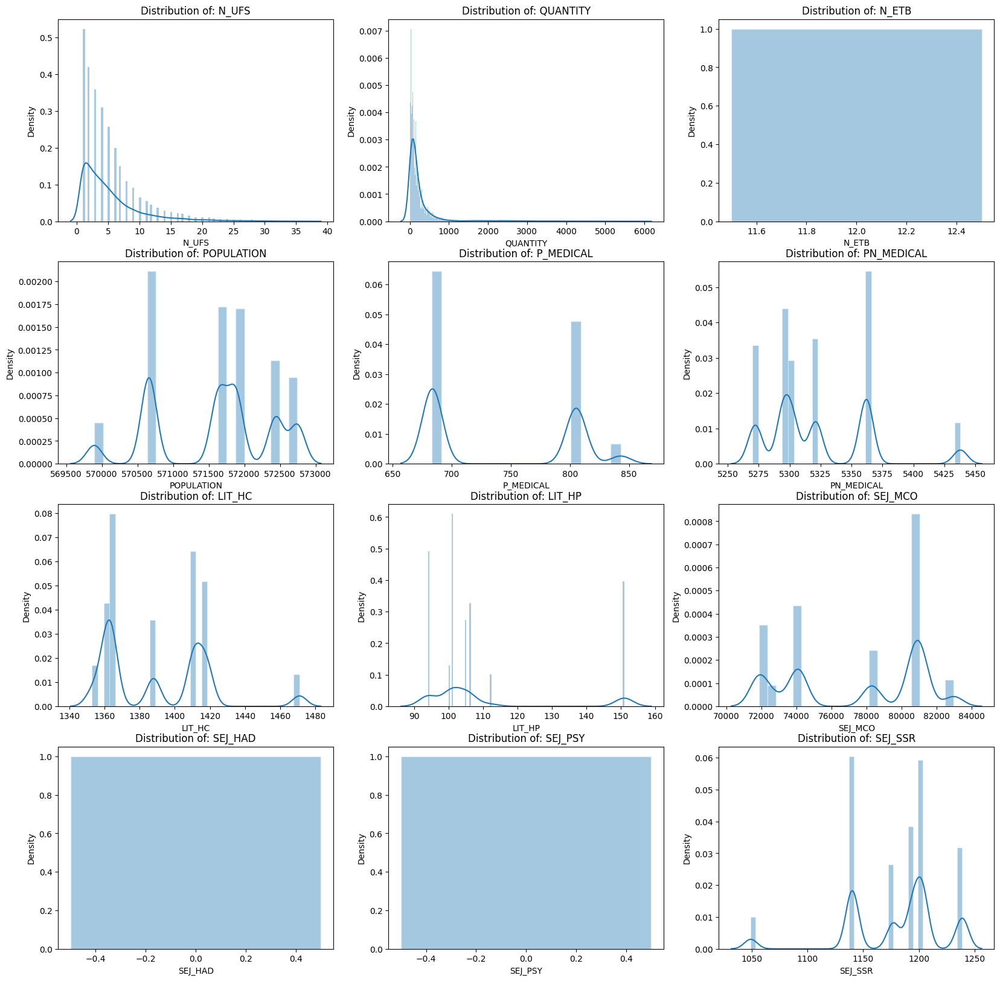

In [ ]:
# Visualizing distribution after outlier removing
# Hospital 1
visualize_distribution(df_h1, numerical_features)

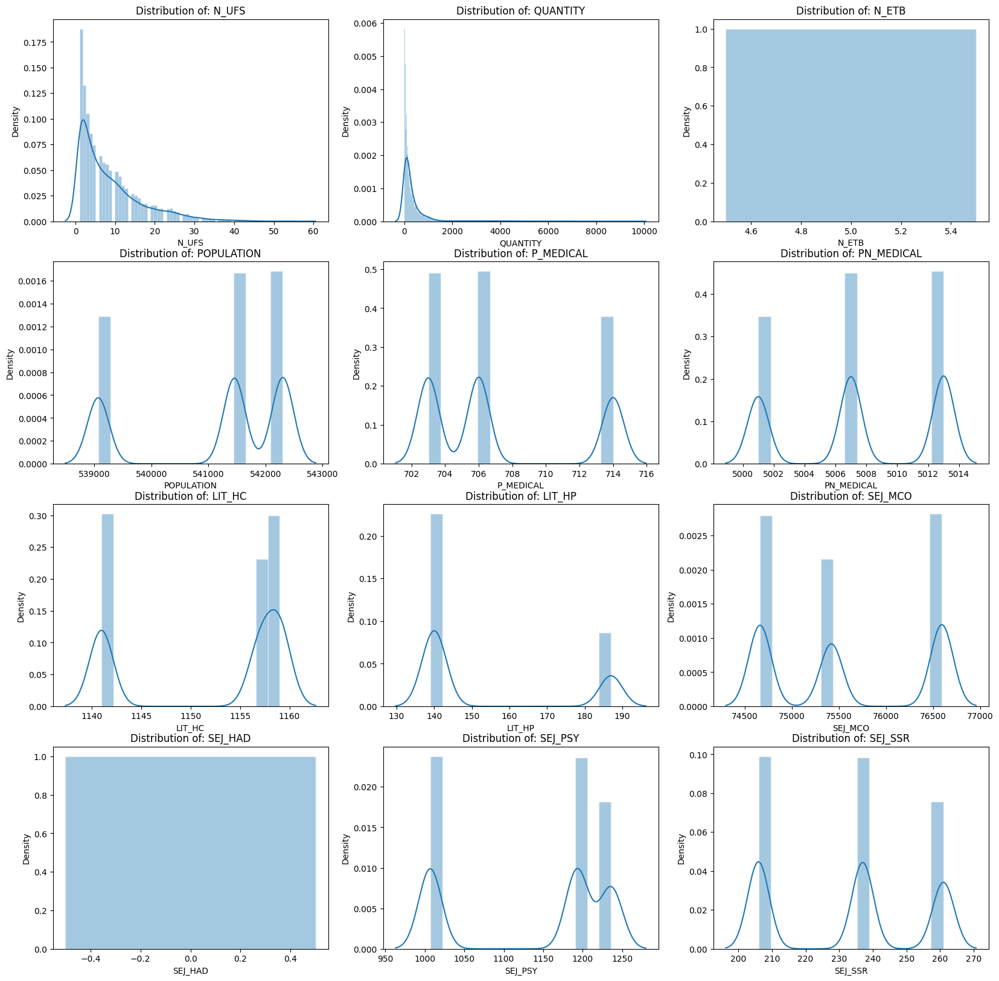

In [ ]:
# Visualizing distribution after outlier removing
# Hospital 2
visualize_distribution(df_h2, numerical_features)

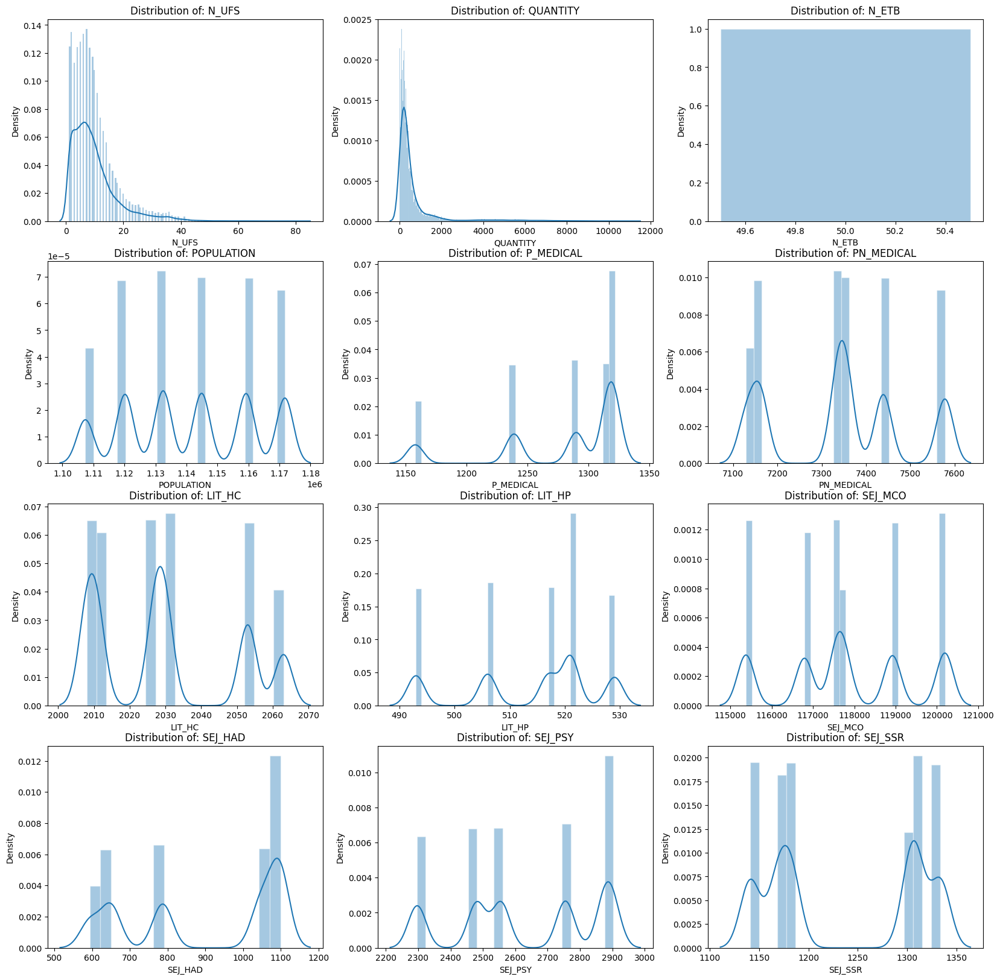

In [ ]:
# Visualizing distribution after outlier removing
# Hospital 3
visualize_distribution(df_h3, numerical_features)

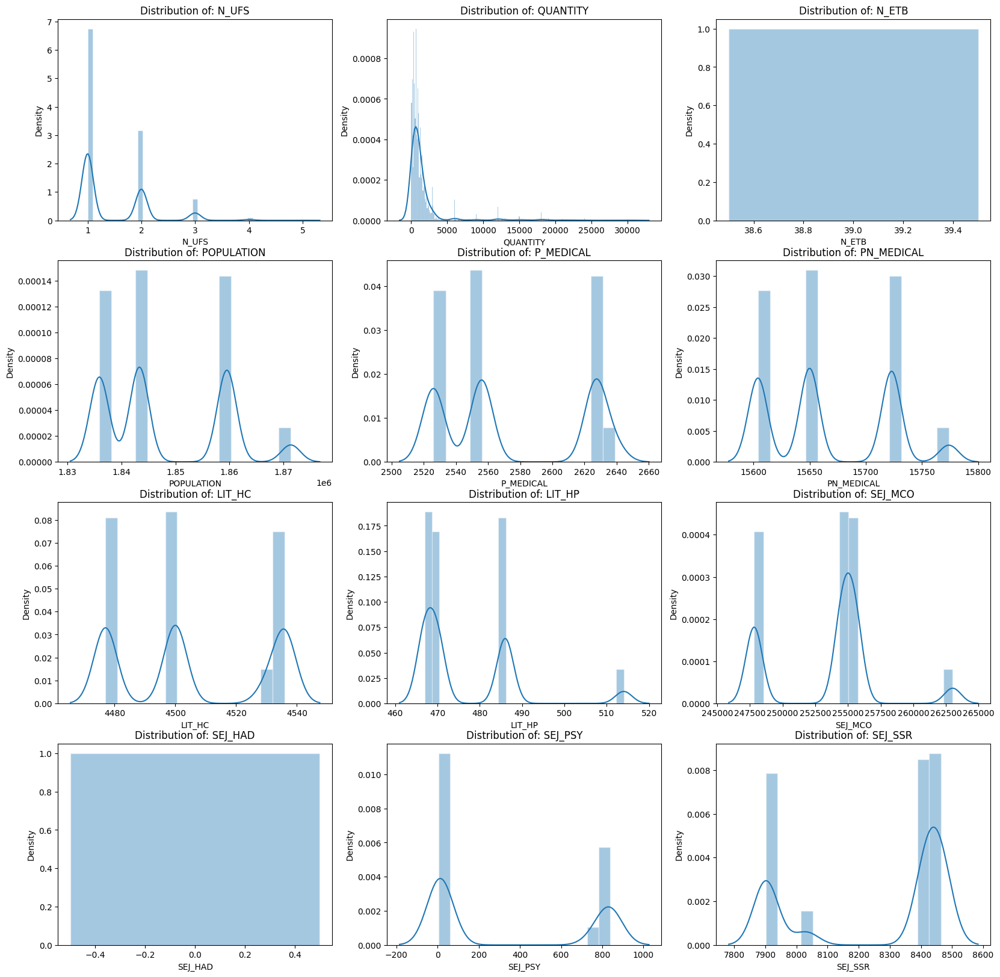

In [ ]:
# Visualizing distribution after outlier removing
# Hospital 4
visualize_distribution(df_h4, numerical_features)

# Filling the gaps in data inputs

In [ ]:
# Identifying a common period for the different timeseries
min_date_h1 = df_h1["DATE_MOUV"].min()
min_date_h2 = df_h2["DATE_MOUV"].min()
min_date_h3 = df_h3["DATE_MOUV"].min()
min_date_h4 = df_h4["DATE_MOUV"].min()

print(f'Min dates:' + f'\n H1: {min_date_h1}' + f'\n H2: {min_date_h2}' + f'\n H3: {min_date_h3}' + f'\n H4: {min_date_h4}')

max_date_h1 = df_h1["DATE_MOUV"].max()
max_date_h2 = df_h2["DATE_MOUV"].max()
max_date_h3 = df_h3["DATE_MOUV"].max()
max_date_h4 = df_h4["DATE_MOUV"].max()
print(f'\n Max dates:' + f'\n H1: {max_date_h1}' + f'\n H2: {max_date_h2}' + f'\n H3: {max_date_h3}' + f'\n H4: {max_date_h4}')

init = max(min_date_h1, min_date_h2, min_date_h3, min_date_h4)
ending = min(max_date_h1, max_date_h2, max_date_h3, max_date_h4)

print('\n')
print(f'Begin date: {init}')
print(f'End date: {ending}')

Min dates:
 H1: 2013-06-18 00:00:00
 H2: 2017-03-30 00:00:00
 H3: 2014-05-20 00:00:00
 H4: 2016-01-01 00:00:00

 Max dates:
 H1: 2019-12-30 00:00:00
 H2: 2019-12-30 00:00:00
 H3: 2019-12-30 00:00:00
 H4: 2019-03-05 00:00:00


Begin date: 2017-03-30 00:00:00
End date: 2019-03-05 00:00:00


In [ ]:
common_period = pd.date_range(start=pd.Timestamp(year=init.year, month=init.month, day=1), end=pd.Timestamp(year=ending.year, month=ending.month, day=31))

df_h1_cp = df_h1[(df_h1["DATE_MOUV"] >= init) & (df_h1["DATE_MOUV"] <= ending)]
df_h2_cp = df_h2[(df_h2["DATE_MOUV"] >= init) & (df_h2["DATE_MOUV"] <= ending)]
df_h3_cp = df_h3[(df_h3["DATE_MOUV"] >= init) & (df_h3["DATE_MOUV"] <= ending)]
df_h4_cp = df_h4[(df_h4["DATE_MOUV"] >= init) & (df_h4["DATE_MOUV"] <= ending)]

In [ ]:
def fill_gap_timeseries(df_cp, common_period,hospital='', visu=False):
    for medicine in df.HOSPI_CODE_UCD.unique():
        id_ref = df_cp[df_cp["HOSPI_CODE_UCD"] == medicine]["ID_REF"].values[0]
        cod_atc = df_cp[df_cp["HOSPI_CODE_UCD"] == medicine]["CODE_ATC"].values[0]

        data = {
            'DATE_MOUV': list(common_period),
            'HOSPI_CODE_UCD': [medicine] * len(common_period),
            'ID_REF': [id_ref] * len(common_period),
            'CODE_ATC': [cod_atc] * len(common_period),
        }

        df_medicine = pd.DataFrame(data)

        df_medicine_resampled = pd.merge(df_medicine, df_cp, on=['DATE_MOUV', 'HOSPI_CODE_UCD', 'ID_REF', 'CODE_ATC'], how='left')
        df_medicine_resampled['N_ETB'] = df_medicine_resampled['N_ETB'].fillna(method='ffill').fillna(method='bfill')
        df_medicine_resampled['N_UFS'] = df_medicine_resampled['N_UFS'].fillna(method='ffill').fillna(method='bfill')
        df_medicine_resampled['POPULATION'] = df_medicine_resampled['POPULATION'].fillna(method='ffill').fillna(method='bfill')
        df_medicine_resampled['P_MEDICAL'] = df_medicine_resampled['P_MEDICAL'].fillna(method='ffill').fillna(method='bfill')
        df_medicine_resampled['PN_MEDICAL'] = df_medicine_resampled['PN_MEDICAL'].fillna(method='ffill').fillna(method='bfill')
        df_medicine_resampled['LIT_HC'] = df_medicine_resampled['LIT_HC'].fillna(method='ffill').fillna(method='bfill')
        df_medicine_resampled['LIT_HP'] = df_medicine_resampled['LIT_HP'].fillna(method='ffill').fillna(method='bfill')
        df_medicine_resampled['SEJ_MCO'] = df_medicine_resampled['SEJ_MCO'].fillna(method='ffill').fillna(method='bfill')
        df_medicine_resampled['SEJ_HAD'] = df_medicine_resampled['SEJ_HAD'].fillna(method='ffill').fillna(method='bfill')
        df_medicine_resampled['SEJ_PSY'] = df_medicine_resampled['SEJ_PSY'].fillna(method='ffill').fillna(method='bfill')
        df_medicine_resampled['SEJ_SSR'] = df_medicine_resampled['SEJ_SSR'].fillna(method='ffill').fillna(method='bfill')
        df_medicine_resampled['SEJ_SLD'] = df_medicine_resampled['SEJ_SLD'].fillna(method='ffill').fillna(method='bfill')
        df_medicine_resampled['QUANTITY'] = df_medicine_resampled['QUANTITY'].fillna(0)

        df_cp = df_cp[df_cp["HOSPI_CODE_UCD"] != medicine]
        df_cp = pd.concat([df_cp, df_medicine_resampled], ignore_index=True)

    df_cp = df_cp.sort_values(by=['DATE_MOUV']).reset_index(drop=True)
    df_cp["WEEK"] = df_cp["DATE_MOUV"]
    df_cp["YEAR"] = df_cp["DATE_MOUV"].dt.year
    df_cp["MONTH"] = df_cp["DATE_MOUV"].dt.month
    df_cp["ID_SITE_RATTACHE"] = hospital
    x = common_period

    if visu:
        fig, axs = plt.subplots(7, 3, figsize=(25, 25))

        for i, medicine in enumerate(df.HOSPI_CODE_UCD.unique()):
            row = i // 3  # Calculate the row index
            col = i % 3   # Calculate the column index

            ax = axs[row, col]  # Get the corresponding subplot

            y = df_cp[df_cp["HOSPI_CODE_UCD"] == medicine]["QUANTITY"]
            ax.scatter(x, y)
            ax.set_title(f'Consumption quantity of medicine: {medicine} per day')
            ax.set_xticks(ax.get_xticks())
            ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
            ax.grid()

        plt.tight_layout()
        plt.show()

    return df_cp


In [ ]:
print(df_h1_cp.QUANTITY.sum())
df_h1_cp = fill_gap_timeseries(df_h1_cp, common_period, 'HOSPI_1')
print(df_h1_cp.QUANTITY.sum())
print()

print(df_h2_cp.QUANTITY.sum())
df_h2_cp = fill_gap_timeseries(df_h2_cp, common_period, 'HOSPI_2')
print(df_h2_cp.QUANTITY.sum())
print()

print(df_h3_cp.QUANTITY.sum())
df_h3_cp = fill_gap_timeseries(df_h3_cp, common_period, 'HOSPI_3')
print(df_h3_cp.QUANTITY.sum())
print()


print(df_h4_cp.QUANTITY.sum())
df_h4_cp = fill_gap_timeseries(df_h4_cp, common_period, 'HOSPI_4')
print(df_h4_cp.QUANTITY.sum())
print()

2907720.0
2907720.0

4118847.0
4118847.0

5925862.0
5925862.0

10266968.0
10266968.0



# Timeseries visualization

In [ ]:
# Grouping the different datasets divided by hospital
df_grouped = pd.concat([df_h1_cp, df_h2_cp, df_h3_cp, df_h4_cp])
df_timeseries_plot = df_grouped.copy()
print(df_timeseries_plot.QUANTITY.sum())

df_timeseries_plot['DATE'] = df_timeseries_plot['DATE_MOUV'].dt.strftime('%Y-%m')

# Aggregating by "HOSPI_CODE_UCD", "YEAR", "MONTH", "ID_SITE_RATTACHE", summing the quantity
df_timeseries_plot = df_timeseries_plot.groupby(["HOSPI_CODE_UCD", "DATE", "ID_SITE_RATTACHE"]).agg({
    'QUANTITY': 'sum',
    'CODE_ATC': 'first',
    'N_UFS': np.median,
    'WEEK': 'first',
    'N_ETB': np.median,
    'POPULATION': np.median,
    'P_MEDICAL': np.median,
    'PN_MEDICAL': np.median,
    'LIT_HC': np.median,
    'LIT_HP': np.median,
    'SEJ_MCO': np.median,
    'SEJ_HAD': np.median,
    'SEJ_PSY': np.median,
    'SEJ_SSR': np.median,
    'SEJ_SLD': np.median
}).reset_index()

df_timeseries_plot = df_timeseries_plot.sort_values(by=['DATE']).reset_index(drop=True)
print(df_timeseries_plot.QUANTITY.sum())

23219397.0
23219397.0


In [ ]:
columns_wo_quantity = ['N_ETB', 'POPULATION', 'P_MEDICAL', 'PN_MEDICAL', 'LIT_HC', 'LIT_HP', 'SEJ_MCO', 'SEJ_HAD', 'SEJ_PSY', 'SEJ_SSR']
for column in columns_wo_quantity:
  for hospital in df_timeseries_plot.ID_SITE_RATTACHE.unique():
    for date in df_timeseries_plot['DATE'].unique():
      values = df_timeseries_plot[(df_timeseries_plot["ID_SITE_RATTACHE"] == hospital) & (df_timeseries_plot['DATE'] == date)][column].values
      median = m.ceil(np.median(values))
      df_timeseries_plot.loc[(df_timeseries_plot['DATE'] == date) & (df_timeseries_plot['ID_SITE_RATTACHE'] == hospital), column] = median
df_timeseries_plot[df_timeseries_plot['ID_SITE_RATTACHE'] == 'HOSPI_1'][['HOSPI_CODE_UCD','DATE', 'N_UFS']]

,HOSPI_CODE_UCD,DATE,N_UFS
0,3400890837149,2017-03,8.0
4,3400892203645,2017-03,1.0
5,3400892697789,2017-03,2.0
9,3400893736135,2017-03,3.0
16,3400892065366,2017-03,2.0
...,...,...,...
2081,3400892088310,2019-03,1.0
2088,3400891996128,2019-03,1.0
2092,3400892669236,2019-03,22.0
2095,3400892697789,2019-03,2.0


In [ ]:
df_h1_resampled = df_timeseries_plot[df_timeseries_plot['ID_SITE_RATTACHE'] == 'HOSPI_1']
df_h1_resampled = df_h1_resampled.sort_values(by=['DATE']).reset_index(drop=True)

df_h2_resampled = df_timeseries_plot[df_timeseries_plot['ID_SITE_RATTACHE'] == 'HOSPI_1']
df_h2_resampled = df_h2_resampled.sort_values(by=['DATE']).reset_index(drop=True)

df_h3_resampled = df_timeseries_plot[df_timeseries_plot['ID_SITE_RATTACHE'] == 'HOSPI_1']
df_h3_resampled = df_h3_resampled.sort_values(by=['DATE']).reset_index(drop=True)

df_h4_resampled = df_timeseries_plot[df_timeseries_plot['ID_SITE_RATTACHE'] == 'HOSPI_1']
df_h4_resampled = df_h4_resampled.sort_values(by=['DATE']).reset_index(drop=True)

In [ ]:
def plot_columns_bfaf(df_before, df_after, column, hospital, date_before = 'DATE_MOUV', date_after = 'DATE'):

    df_hospi_before = df_before[(df_before[date_before] >= init) & (df_before[date_before] <= ending)]
    df_hospi_before = df_hospi_before.sort_values(by=[date_before]).reset_index(drop=True)

    if column == 'QUANTITY':
      for medicine in df_before.HOSPI_CODE_UCD.unique():

        # Plot 1
        x = df_hospi_before[df_hospi_before['HOSPI_CODE_UCD'] == medicine][date_before]

        y = df_hospi_before[df_hospi_before['HOSPI_CODE_UCD'] == medicine][column].values

        fig, axs = plt.subplots(1, 2, figsize=(12, 4))

        axs[0].scatter(x, y)
        axs[0].set_xlabel(date_before)
        axs[0].set_ylabel(column)
        axs[0].set_title(f'{column} Before aggregation' + f' medicine: {medicine}')
        axs[0].grid(True)
        axs[0].set_xticks(axs[0].get_xticks())
        axs[0].set_xticklabels(axs[0].get_xticklabels(), rotation=45)

        # Plot 2
        x = df_after[df_after['HOSPI_CODE_UCD'] == medicine][date_after]
        y = df_after[df_after['HOSPI_CODE_UCD'] == medicine][column].values
        axs[1].scatter(x, y)
        axs[1].set_xlabel(date_after)
        axs[1].set_ylabel(column)
        axs[1].set_title(f'{column} After aggregation' + f' medicine: {medicine}')
        axs[1].grid(True)
        axs[1].set_xticks(axs[1].get_xticks())
        axs[1].set_xticklabels(axs[1].get_xticklabels(), rotation=45)

        plt.tight_layout()
        plt.show()
        print()

    else:
      fig, axs = plt.subplots(1, 2, figsize=(12, 4))
      x = df_hospi_before[date_before]

      y = df_hospi_before[column]

      axs[0].scatter(x, y)
      axs[0].set_xlabel(date_before)
      axs[0].set_ylabel(column)
      axs[0].set_title(f'{column} Before aggregation')
      axs[0].grid(True)
      axs[0].set_xticks(axs[0].get_xticks())
      axs[0].set_xticklabels(axs[0].get_xticklabels(), rotation=45)

      # Plot 2
      x = df_after[date_after]
      y = df_after[column].values
      axs[1].scatter(x, y)
      axs[1].set_xlabel(date_after)
      axs[1].set_ylabel(column)
      axs[1].set_title(f'{column} After aggregation')
      axs[1].grid(True)
      axs[1].set_xticks(axs[1].get_xticks())
      axs[1].set_xticklabels(axs[1].get_xticklabels(), rotation=45)

      plt.tight_layout()
      plt.show()
      print()

In [ ]:
def replace_numerical_outliers(df, column_name):
  for medicine in df.HOSPI_CODE_UCD.unique():
      subset = df[df['HOSPI_CODE_UCD'] == medicine]
      q1 = subset[column_name].quantile(0.25)
      q3 = subset[column_name].quantile(0.75)
      iqr = q3 - q1
      lower_bound = q1 - 1.5 * iqr
      upper_bound = q3 + 1.5 * iqr
      outliers = (subset[column_name] < lower_bound) | (subset[column_name] > upper_bound)
      subset.loc[outliers, column_name] = subset[column_name].median()
      df.update(subset)

In [ ]:
def replace_zeros_with_median(df, column):
    for medicine in df[column].unique():
        median_value = df[df[column] != 0][df[column] != np.nan][df[column] != np.inf][df[column] != -np.inf][df[column] != np.nanmedian(df[column])].median()
        df.loc[(df[column] == 0) & (df[column] == medicine), column] = median_value
    return df

In [ ]:
replace_numerical_outliers(df_h1_resampled, 'QUANTITY')
replace_numerical_outliers(df_h2_resampled, 'QUANTITY')
replace_numerical_outliers(df_h3_resampled, 'QUANTITY')
replace_numerical_outliers(df_h4_resampled, 'QUANTITY')

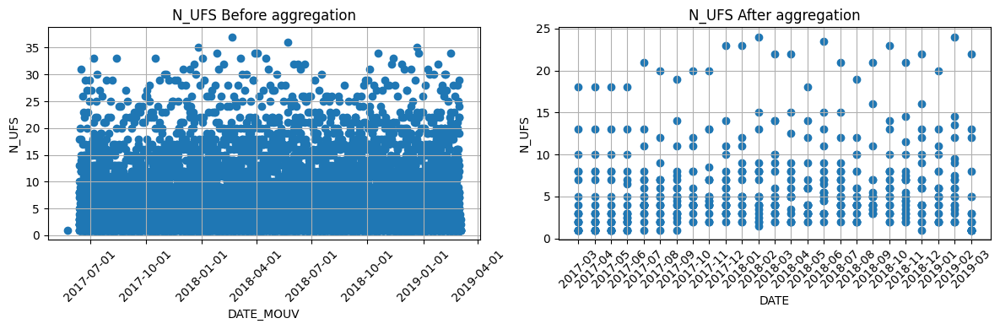

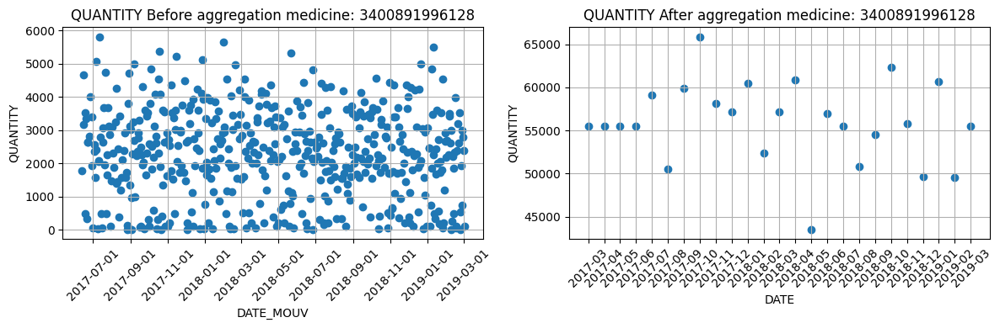

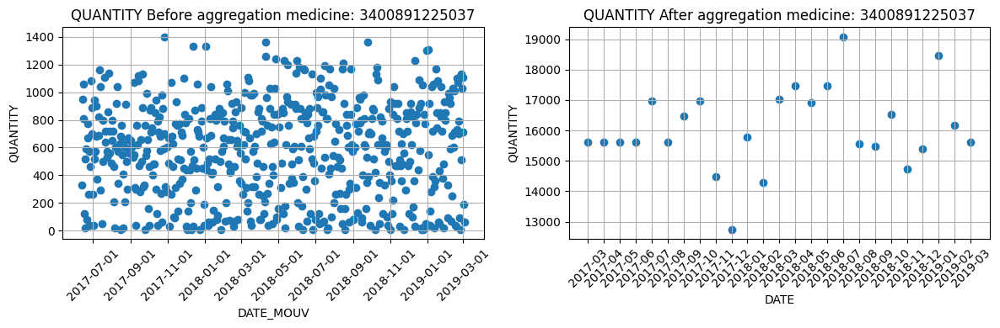

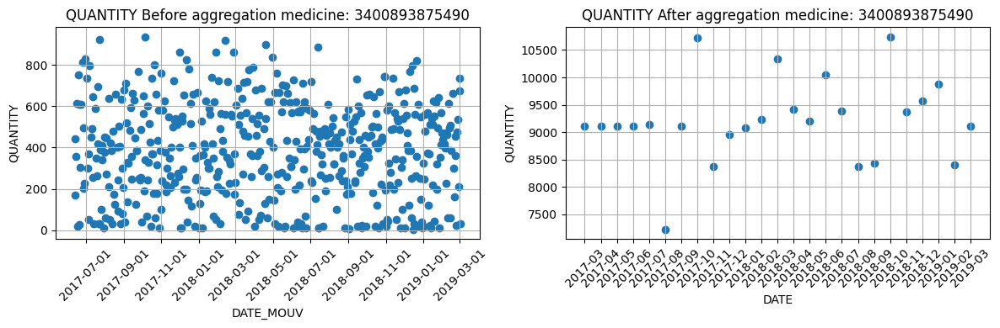

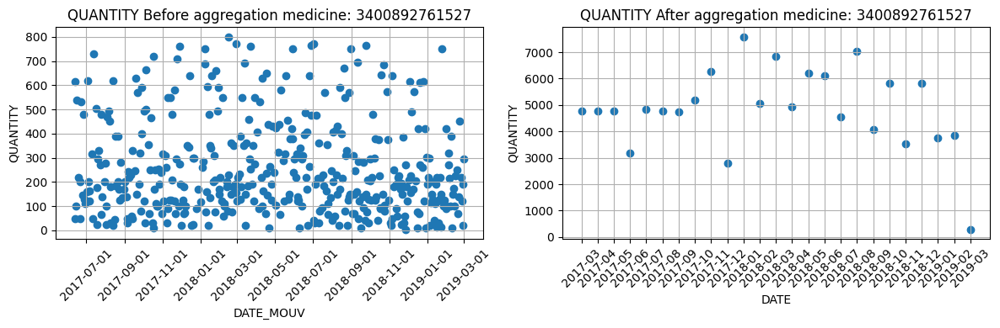

...

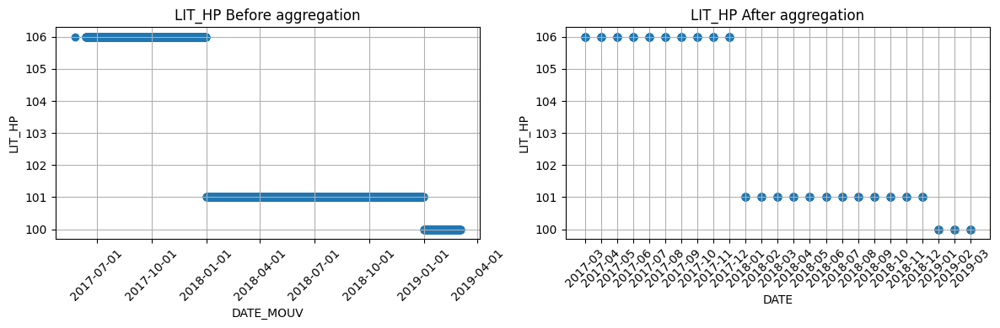

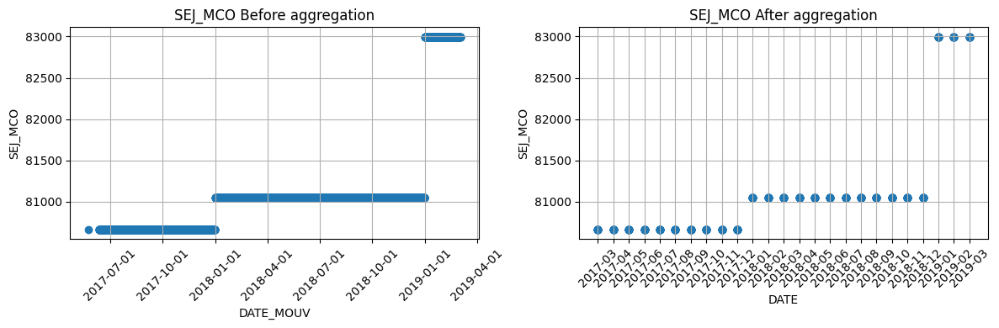

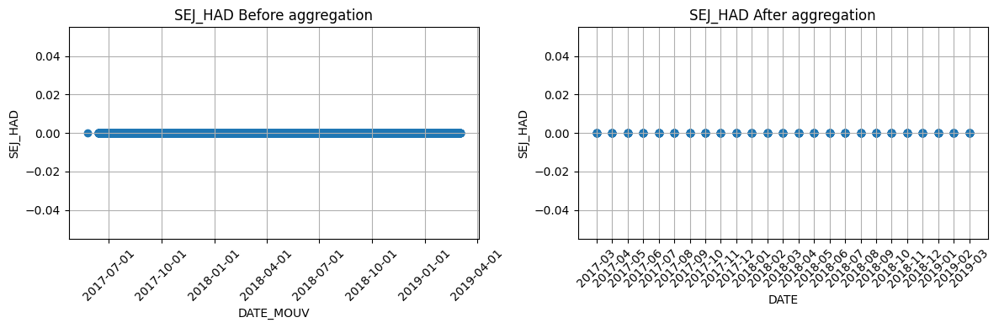

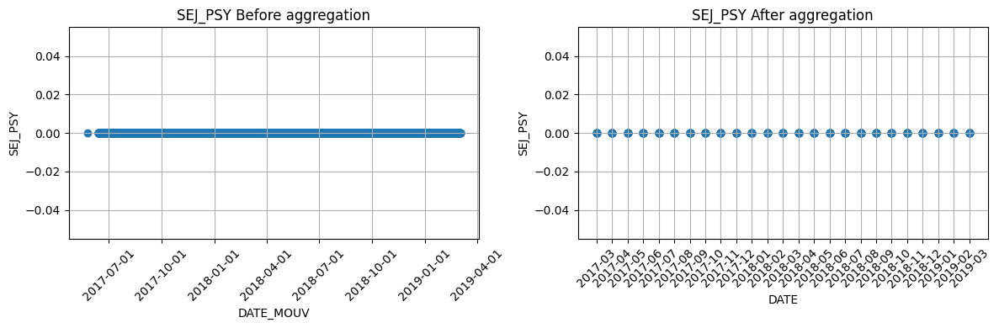

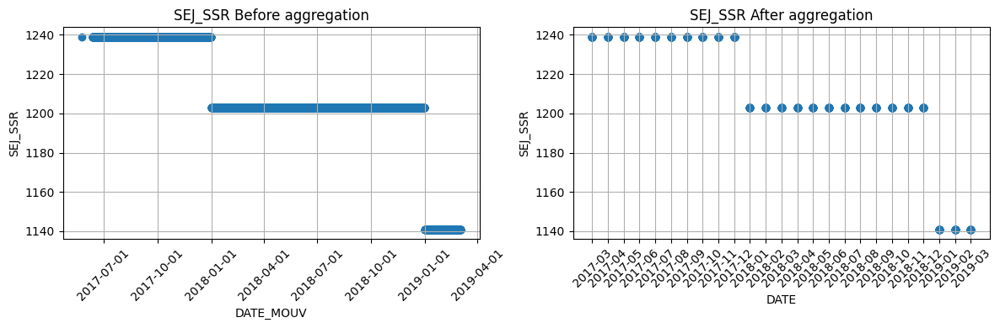

In [ ]:
for column in numerical_features:
  plot_columns_bfaf(df_h1, df_h1_resampled, column, 'HOSPI_1', date_before = 'DATE_MOUV', date_after = 'DATE')

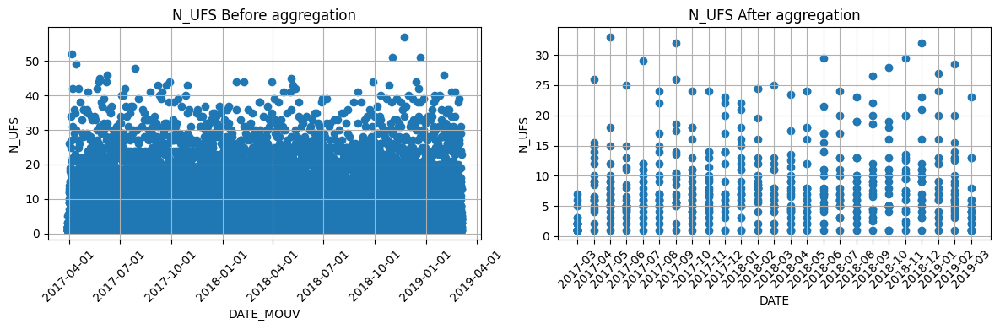

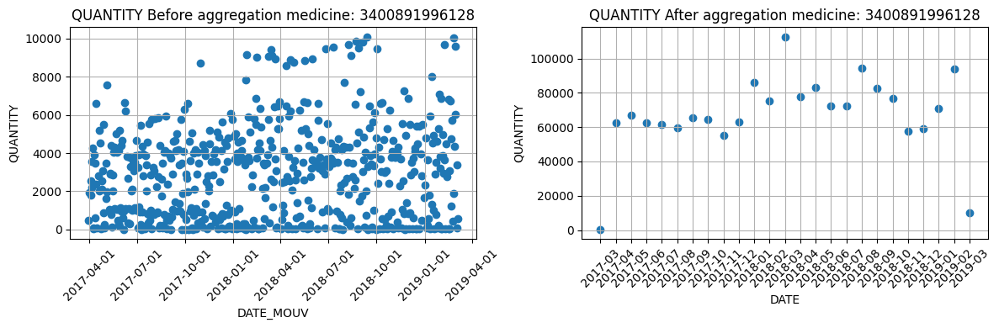

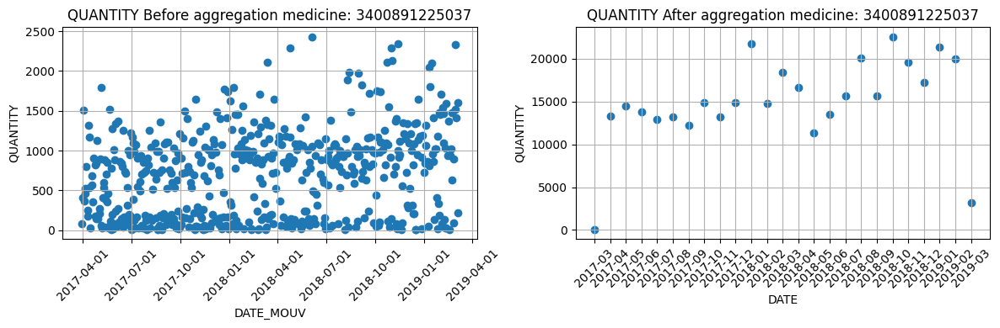

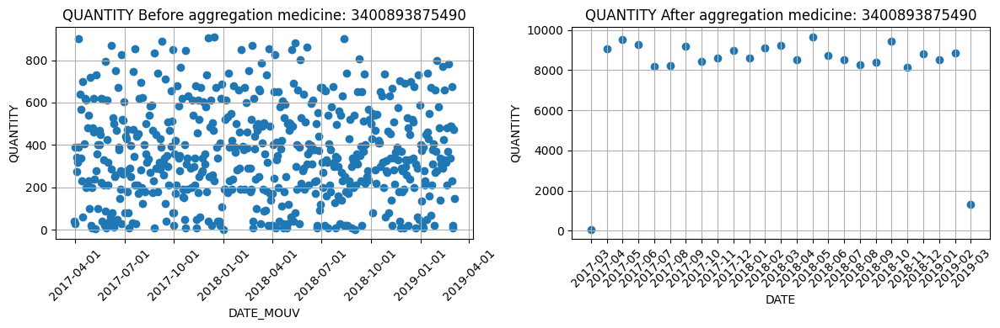

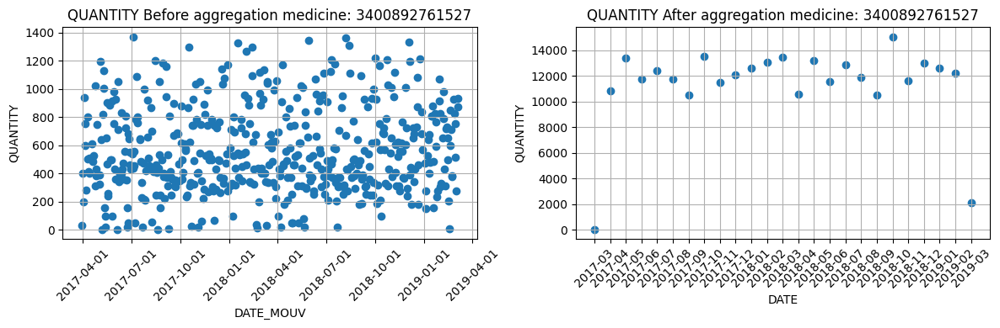

...

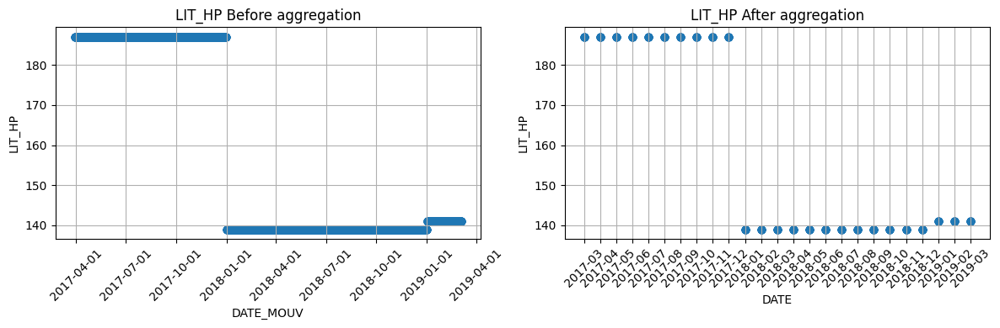

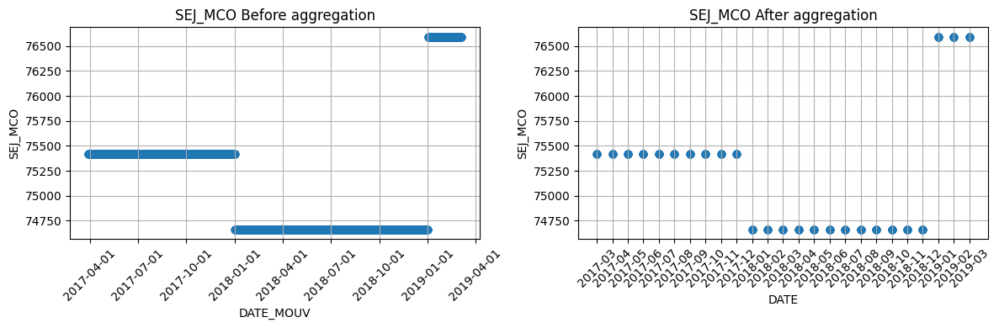

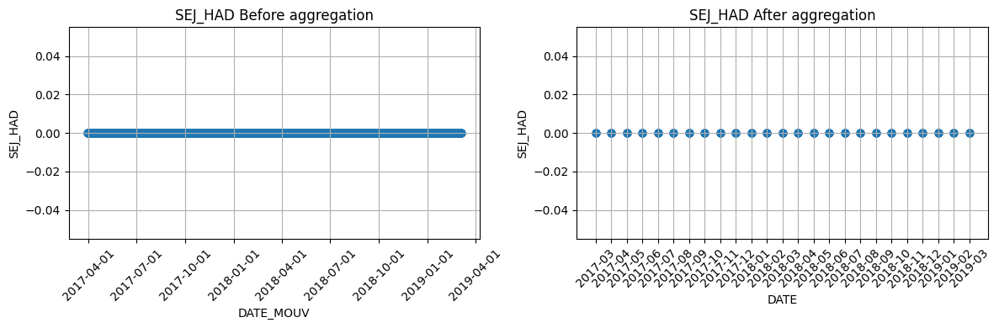

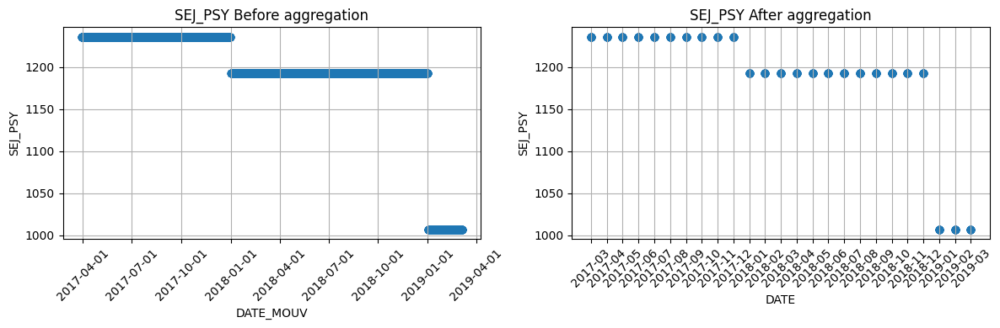

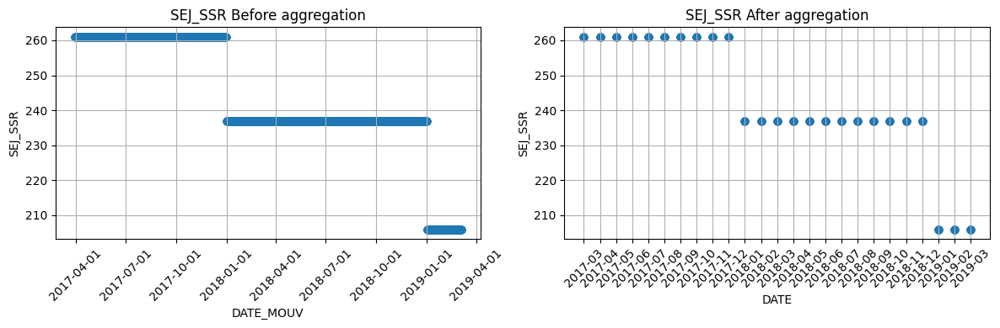

In [ ]:
for column in numerical_features:
  plot_columns_bfaf(df_h2, df_timeseries_plot[df_timeseries_plot['ID_SITE_RATTACHE'] == 'HOSPI_2'], column, 'HOSPI_2', date_before = 'DATE_MOUV', date_after = 'DATE')

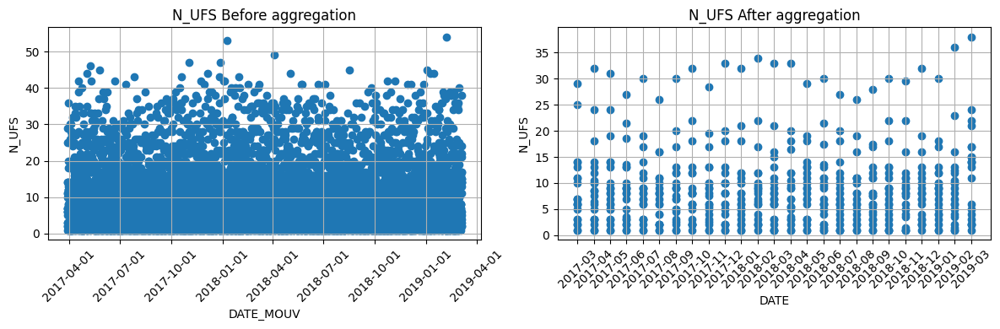

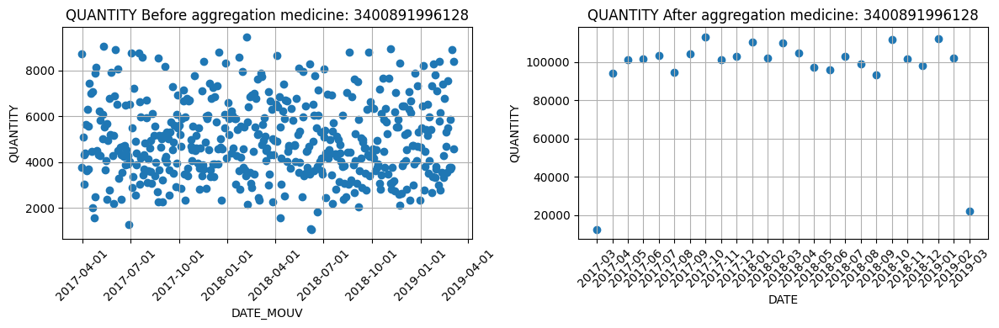

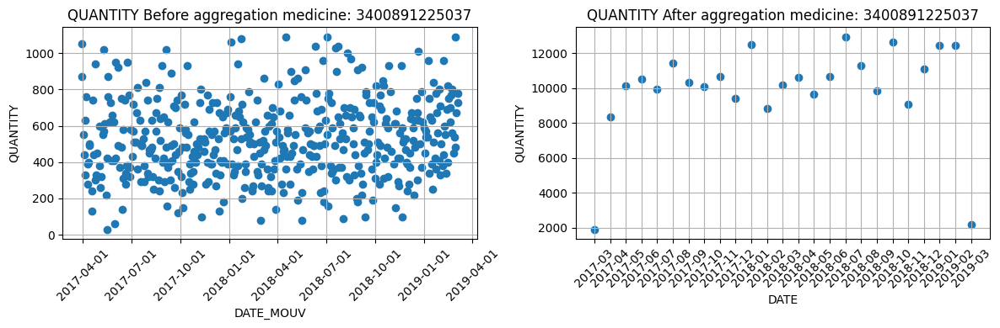

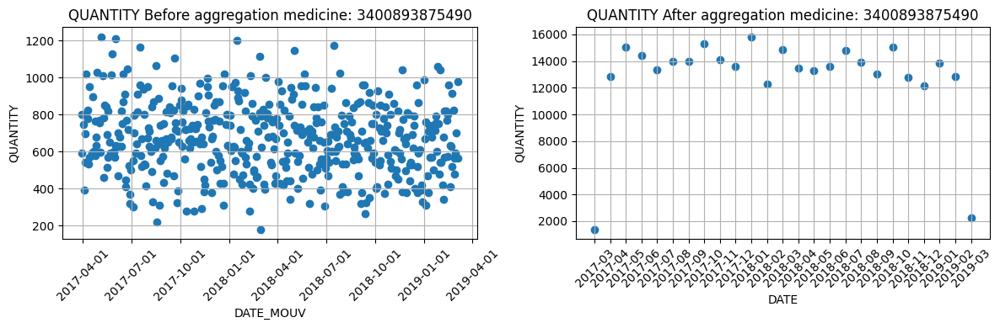

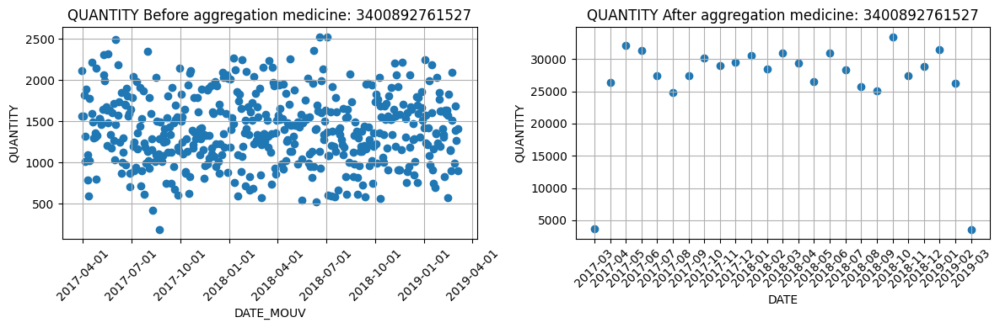

...

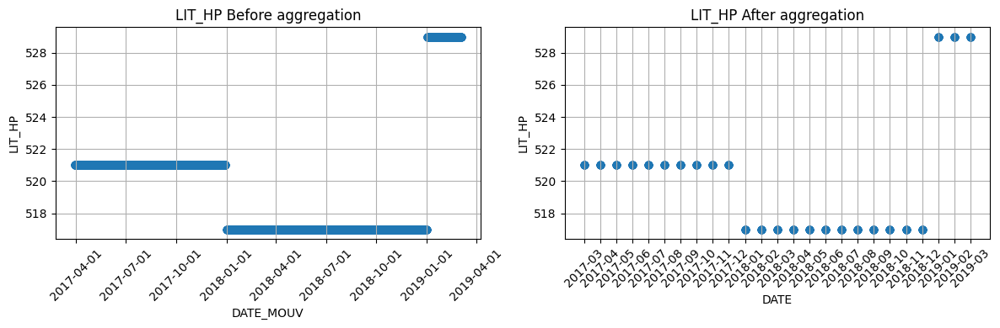

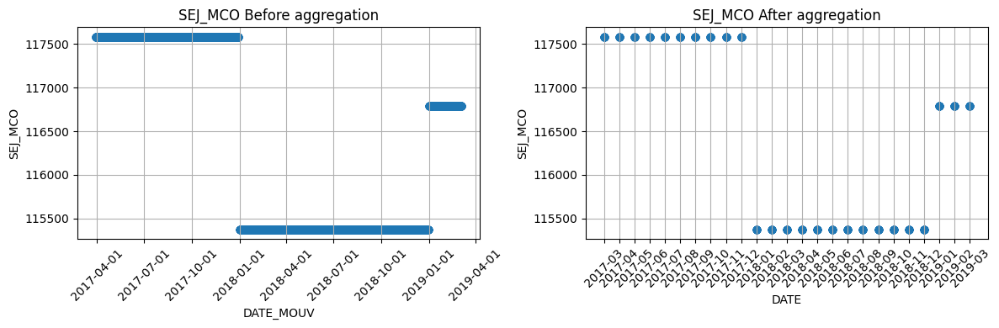

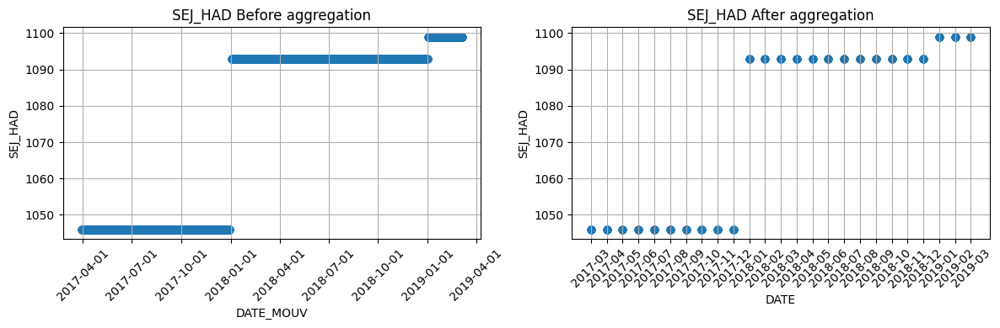

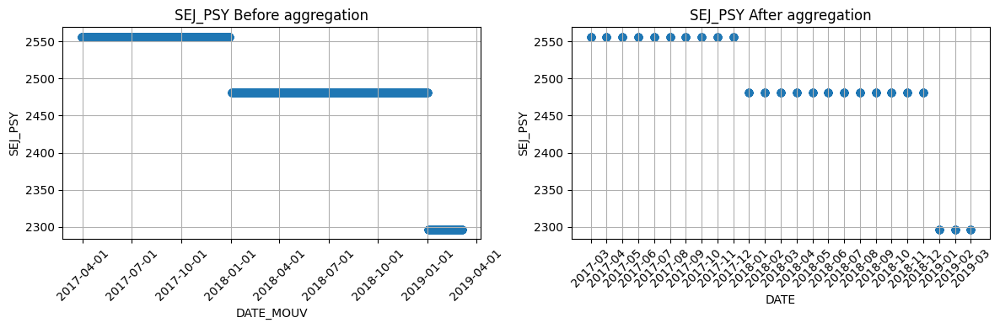

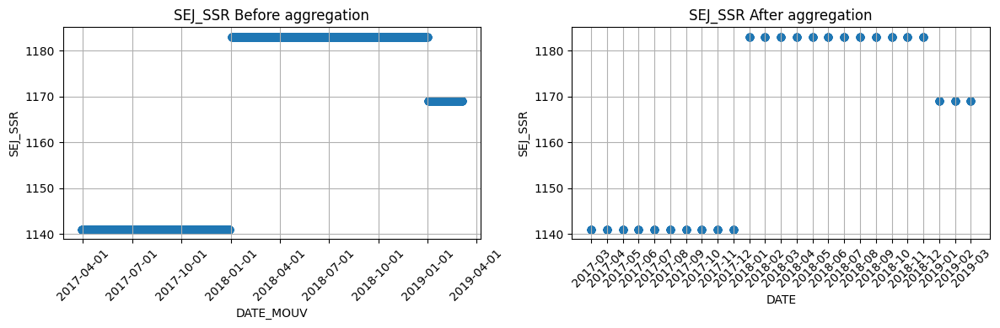

In [ ]:
for column in numerical_features:
  plot_columns_bfaf(df_h3, df_timeseries_plot[df_timeseries_plot['ID_SITE_RATTACHE'] == 'HOSPI_3'], column, 'HOSPI_3', date_before = 'DATE_MOUV', date_after = 'DATE')

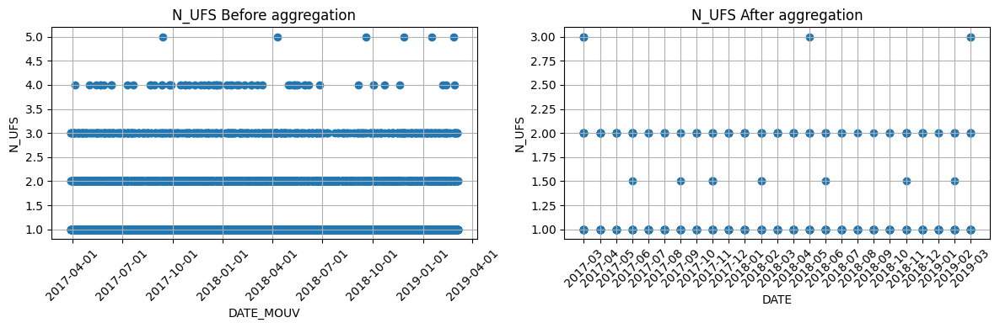

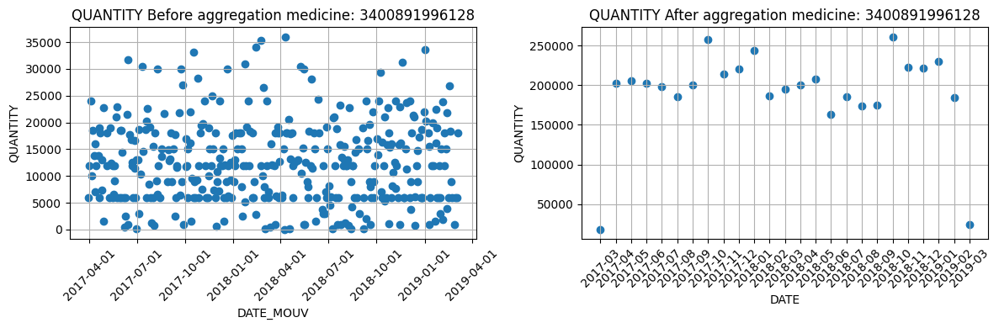

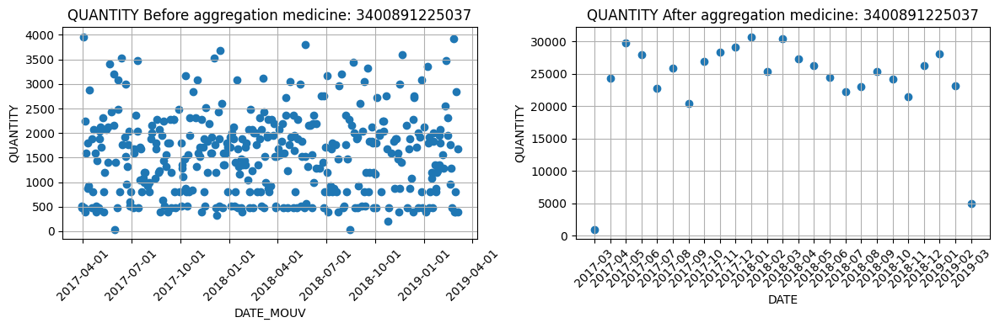

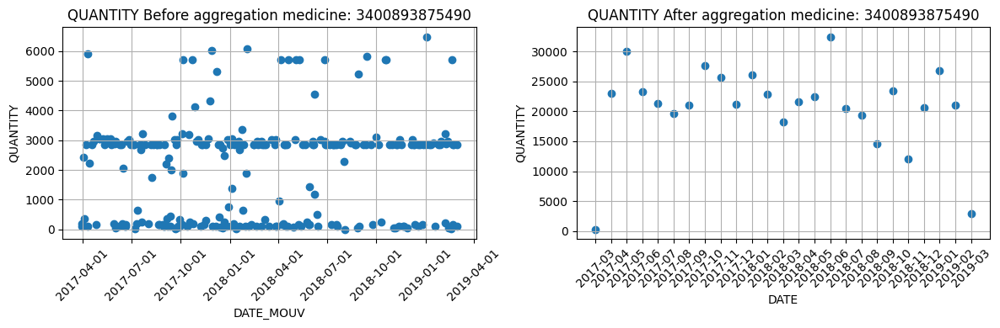

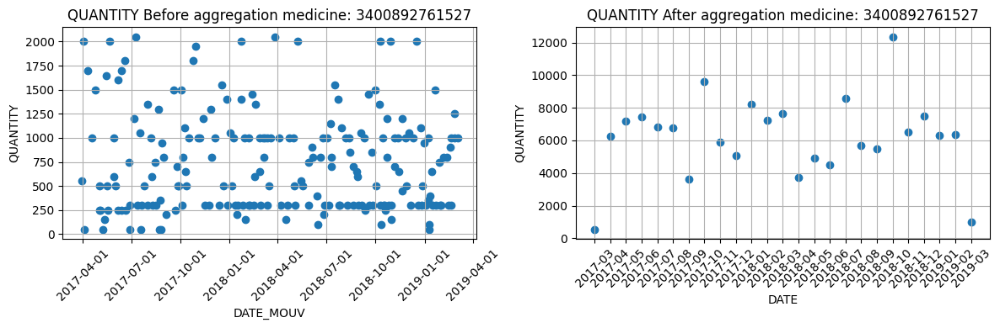

...

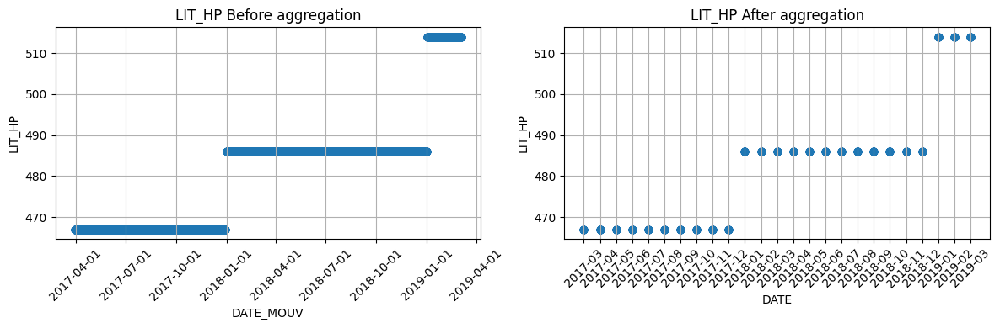

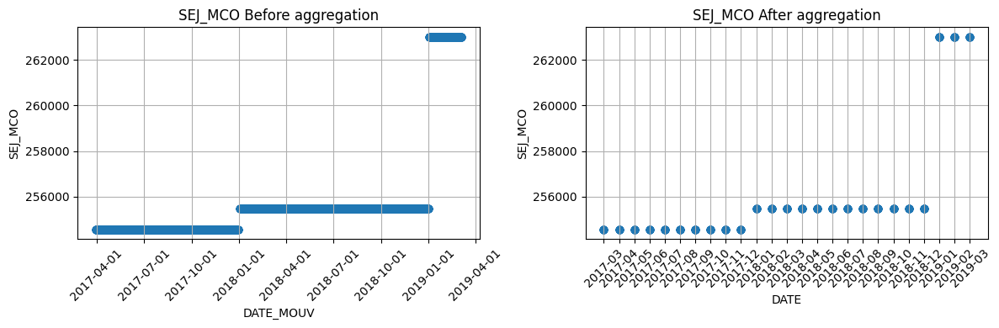

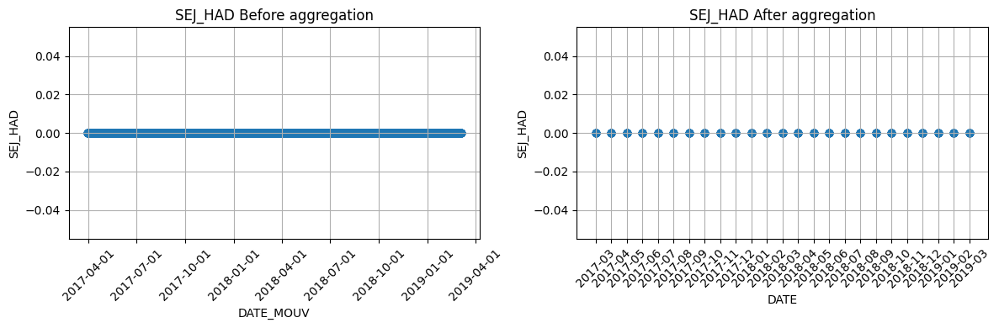

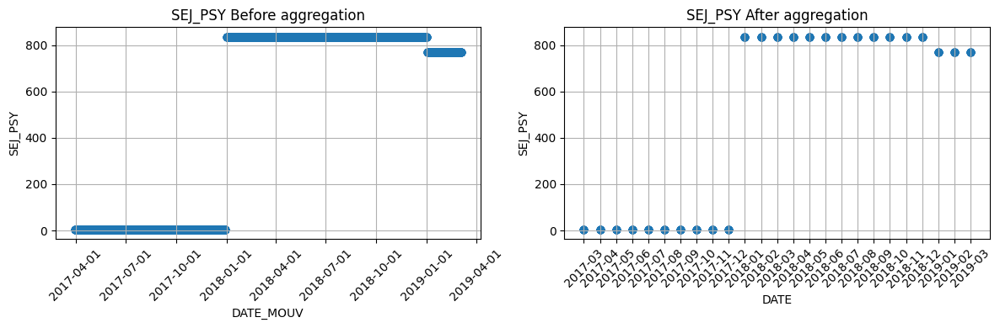

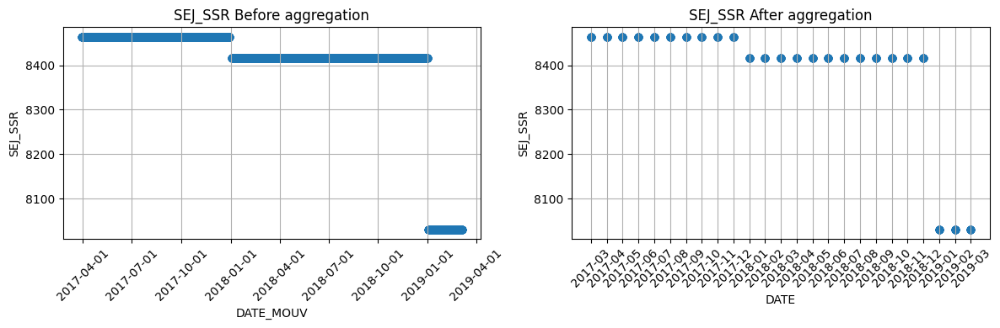

In [ ]:
for column in numerical_features:
  plot_columns_bfaf(df_h4, df_timeseries_plot[df_timeseries_plot['ID_SITE_RATTACHE'] == 'HOSPI_4'], column, 'HOSPI_4', date_before = 'DATE_MOUV', date_after = 'DATE')

In [ ]:
df_timeseries_plot.to_csv('dataset_resampled.csv',
                          index=True)

df_timeseries_plot

,HOSPI_CODE_UCD,DATE,ID_SITE_RATTACHE,QUANTITY,CODE_ATC,N_UFS,WEEK,N_ETB,POPULATION,P_MEDICAL,PN_MEDICAL,LIT_HC,LIT_HP,SEJ_MCO,SEJ_HAD,SEJ_PSY,SEJ_SSR,SEJ_SLD
0,3400890837149,2017-03,HOSPI_1,0.0,N05BA04,8.0,2017-03-01,12.0,572443.0,806.0,5303.0,1360.0,106.0,80667.0,0.0,0.0,1239.0,122.0
1,3400892203645,2017-03,HOSPI_4,300.0,H02AB06,1.0,2017-03-01,39.0,1843319.0,2556.0,15650.0,4500.0,467.0,254570.0,0.0,5.0,8464.0,285.0
2,3400892203645,2017-03,HOSPI_3,340.0,H02AB06,6.0,2017-03-01,50.0,1144892.0,1316.0,7356.0,2027.0,521.0,117583.0,1046.0,2556.0,1141.0,120.0
3,3400892203645,2017-03,HOSPI_2,115.0,H02AB06,2.0,2017-03-01,5.0,539067.0,714.0,5001.0,1157.0,187.0,75420.0,0.0,1236.0,261.0,0.0
4,3400892203645,2017-03,HOSPI_1,0.0,H02AB06,1.0,2017-03-01,12.0,572443.0,806.0,5303.0,1360.0,106.0,80667.0,0.0,0.0,1239.0,122.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2095,3400892697789,2019-03,HOSPI_1,20.0,M03BX01,2.0,2019-03-01,12.0,569894.0,843.0,5438.0,1353.0,100.0,82997.0,0.0,0.0,1141.0,92.0
2096,3400892761695,2019-03,HOSPI_3,5415.0,B05XA03,17.0,2019-03-01,50.0,1171739.0,1318.0,7578.0,2011.0,529.0,116793.0,1099.0,2297.0,1169.0,124.0
2097,3400892761695,2019-03,HOSPI_2,1990.0,B05XA03,13.0,2019-03-01,5.0,542302.0,706.0,5013.0,1141.0,141.0,76593.0,0.0,1007.0,206.0,0.0
2098,3400892052120,2019-03,HOSPI_1,280.0,N02AX02,5.0,2019-03-01,12.0,569894.0,843.0,5438.0,1353.0,100.0,82997.0,0.0,0.0,1141.0,92.0
